In [14]:
#Adapted from https://pyimagesearch.com/2022/02/21/u-net-image-segmentation-in-keras/
#Try a larger dataset for better performace.
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping

In [15]:
#Download sample dataset
dataset, info = tfds.load('oxford_iiit_pet:4.*.*', with_info=True)

In [16]:
#Data pre-processing
def resize(input_image, input_mask):
   input_image = tf.image.resize(input_image, (128, 128), method="nearest")
   input_mask = tf.image.resize(input_mask, (128, 128), method="nearest")
   return input_image, input_mask

def augment(input_image, input_mask):
   if tf.random.uniform(()) > 0.5:
       # Random flipping of the image and mask
       input_image = tf.image.flip_left_right(input_image)
       input_mask = tf.image.flip_left_right(input_mask)

   return input_image, input_mask

def normalize(input_image, input_mask):
   input_image = tf.cast(input_image, tf.float32) / 255.0
   input_mask -= 1
   return input_image, input_mask

In [17]:
#Dataloaders
def load_image_train(datapoint):
   input_image = datapoint["image"]
   input_mask = datapoint["segmentation_mask"]
   input_image, input_mask = resize(input_image, input_mask)
   input_image, input_mask = augment(input_image, input_mask)
   input_image, input_mask = normalize(input_image, input_mask)

   return input_image, input_mask

def load_image_test(datapoint):
   input_image = datapoint["image"]
   input_mask = datapoint["segmentation_mask"]
   input_image, input_mask = resize(input_image, input_mask)
   input_image, input_mask = normalize(input_image, input_mask)

   return input_image, input_mask

In [18]:
train_dataset = dataset["train"].map(load_image_train, num_parallel_calls=tf.data.AUTOTUNE)
test_dataset = dataset["test"].map(load_image_test, num_parallel_calls=tf.data.AUTOTUNE)

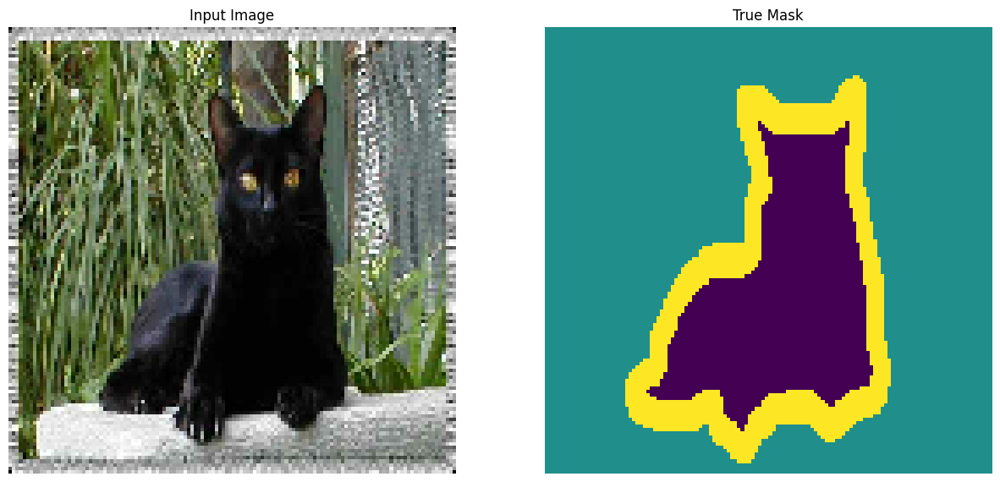

In [19]:
def display(display_list):
 plt.figure(figsize=(15, 15))

 title = ["Input Image", "True Mask", "Predicted Mask"]

 for i in range(len(display_list)):
   plt.subplot(1, len(display_list), i+1)
   plt.title(title[i])
   plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
   plt.axis("off")
 plt.show()

sample_batch = next(iter(train_batches))
random_index = np.random.choice(sample_batch[0].shape[0])
sample_image, sample_mask = sample_batch[0][random_index], sample_batch[1][random_index]
display([sample_image, sample_mask])

In [22]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Positional Embedding Function
def get_positional_embeddings(seq_len, d_model):
    pos = tf.range(seq_len, dtype=tf.float32)[:, tf.newaxis]
    i = tf.range(d_model, dtype=tf.float32)[tf.newaxis, :]
    angle_rates = 1 / tf.pow(10000.0, (2 * (i // 2)) / tf.cast(d_model, tf.float32))
    angle_rads = pos * angle_rates
    sines = tf.math.sin(angle_rads[:, 0::2])
    cosines = tf.math.cos(angle_rads[:, 1::2])
    pos_encoding = tf.concat([sines, cosines], axis=-1)
    return tf.expand_dims(pos_encoding, axis=0)  # shape: (1, seq_len, d_model)

# Transformer Block
class TransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, rate=0.1):
        super().__init__()
        self.att = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim // num_heads)
        self.ffn = models.Sequential([
            layers.Dense(ff_dim, activation='gelu'),
            layers.Dense(embed_dim),
        ])
        self.layernorm1 = layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = layers.LayerNormalization(epsilon=1e-6)
        self.dropout1 = layers.Dropout(rate)
        self.dropout2 = layers.Dropout(rate)

    def call(self, inputs, training=None):
        attn_output = self.att(inputs, inputs)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout2(ffn_output, training=training)
        return self.layernorm2(out1 + ffn_output)

# Small ViT-U-Net with Skip Connections
def small_vit_unet_segmentation_model(
    input_shape=(128, 128, 3),
    patch_size=16,
    num_classes=3,
    projection_dim=64,
    transformer_layers=2,
    num_heads=2,
    ff_dim=128,
):
    inputs = layers.Input(shape=input_shape)
    patch_h = patch_w = patch_size
    patch_grid_size = input_shape[0] // patch_size
    num_patches = patch_grid_size ** 2

    # Initial CNN Stem (for early feature extraction and skip connection)
    x = layers.Conv2D(32, 3, strides=1, padding="same", activation="relu")(inputs)
    skip1 = x  # 128x128

    x = layers.Conv2D(64, 3, strides=2, padding="same", activation="relu")(x)
    skip2 = x  # 64x64

    x = layers.Conv2D(128, 3, strides=2, padding="same", activation="relu")(x)
    skip3 = x  # 32x32

    # Patch extraction
    def extract_patches_fn(x):
        patches = tf.image.extract_patches(
            images=x,
            sizes=[1, patch_h, patch_w, 1],
            strides=[1, patch_h, patch_w, 1],
            rates=[1, 1, 1, 1],
            padding='VALID'
        )
        return tf.reshape(patches, [tf.shape(x)[0], -1, patch_h * patch_w * input_shape[2]])

    patches = layers.Lambda(extract_patches_fn)(inputs)
    x = layers.Dense(projection_dim)(patches)

    # Add positional encoding
    pos_encoding = get_positional_embeddings(num_patches, projection_dim)
    x = x + pos_encoding[:, :num_patches, :]

    # Transformer blocks
    for _ in range(transformer_layers):
        x = TransformerBlock(projection_dim, num_heads, ff_dim)(x)

    # Bottleneck output reshape
    x = layers.Reshape((patch_grid_size, patch_grid_size, projection_dim))(x)  # 8x8

    # Decoder with skip connections
    x = layers.Conv2DTranspose(128, 3, strides=2, padding="same", activation="relu")(x)  # 8 → 16

    # Resize skip3 from 32x32 → 16x16
    skip3_resized = layers.Resizing(16, 16)(skip3)
    skip3_resized = layers.Conv2D(128, 1, padding="same")(skip3_resized)
    x = layers.Concatenate()([x, skip3_resized])

    x = layers.Conv2DTranspose(64, 3, strides=2, padding="same", activation="relu")(x)   # 16 → 32
    skip2_resized = layers.Resizing(32, 32)(skip2)
    skip2_resized = layers.Conv2D(64, 1, padding="same")(skip2_resized)
    x = layers.Concatenate()([x, skip2_resized])

    x = layers.Conv2DTranspose(32, 3, strides=2, padding="same", activation="relu")(x)   # 32 → 64
    skip1_resized = layers.Resizing(64, 64)(skip1)
    skip1_resized = layers.Conv2D(32, 1, padding="same")(skip1_resized)
    x = layers.Concatenate()([x, skip1_resized])

    x = layers.Conv2DTranspose(16, 3, strides=2, padding="same", activation="relu")(x)   # 64 → 128
    # Output layer
    outputs = layers.Conv2D(num_classes, 1, activation="softmax", padding="same")(x)

    return tf.keras.Model(inputs=inputs, outputs=outputs, name="SmallViT-U-Net-Skip")

In [23]:
# Define the model
unet_model = small_vit_unet_segmentation_model(input_shape=(128, 128, 3))


unet_model.compile(optimizer=tf.keras.optimizers.Adam(),
                  loss="sparse_categorical_crossentropy",
                  metrics=['accuracy'])

In [24]:
#Training loop

# Define early stopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',       # Metric to monitor
    patience=10,              # Stop after 10 epochs without improvement
    restore_best_weights=True # Restore model weights from the epoch with the best value of the monitored quantity
)

# Define training parameters
NUM_EPOCHS = 100  # More epochs, but early stopping will likely halt before reaching this
TRAIN_LENGTH = info.splits["train"].num_examples
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
VAL_SUBSPLITS = 5
TEST_LENTH = info.splits["test"].num_examples
VALIDATION_STEPS = TEST_LENTH // BATCH_SIZE // VAL_SUBSPLITS

# Start training with early stopping
model_history = unet_model.fit(
    train_batches,
    epochs=NUM_EPOCHS,
    steps_per_epoch=STEPS_PER_EPOCH,
    validation_steps=VALIDATION_STEPS,
    verbose=1,
    validation_data=test_batches,
    callbacks=[early_stopping]
)

Epoch 1/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 44s 352ms/step - accuracy: 0.5302 - loss: 0.9751 - val_accuracy: 0.6281 - val_loss: 0.8015
Epoch 2/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 27s 278ms/step - accuracy: 0.6977 - loss: 0.7506 - val_accuracy: 0.7195 - val_loss: 0.7047
Epoch 3/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 14s 244ms/step - accuracy: 0.7316 - loss: 0.6805 - val_accuracy: 0.7374 - val_loss: 0.6630
Epoch 4/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - accuracy: 0.7465 - loss: 0.6440 - val_accuracy: 0.7561 - val_loss: 0.6131
Epoch 5/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 15s 263ms/step - accuracy: 0.7558 - loss: 0.6198 - val_accuracy: 0.7601 - val_loss: 0.6039
Epoch 6/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 15s 269ms/step - accuracy: 0.7652 - loss: 0.5945 - val_accuracy: 0.7712 - val_loss: 0.5771
Epoch 7/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 15s 265ms/step - accuracy: 0.7722 - loss: 0.5749 - val_accuracy: 0.7821 - val_loss: 0.5480
Epoch 8/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 17s 299ms/step - accuracy: 0.7876 - loss: 0.5356 - 

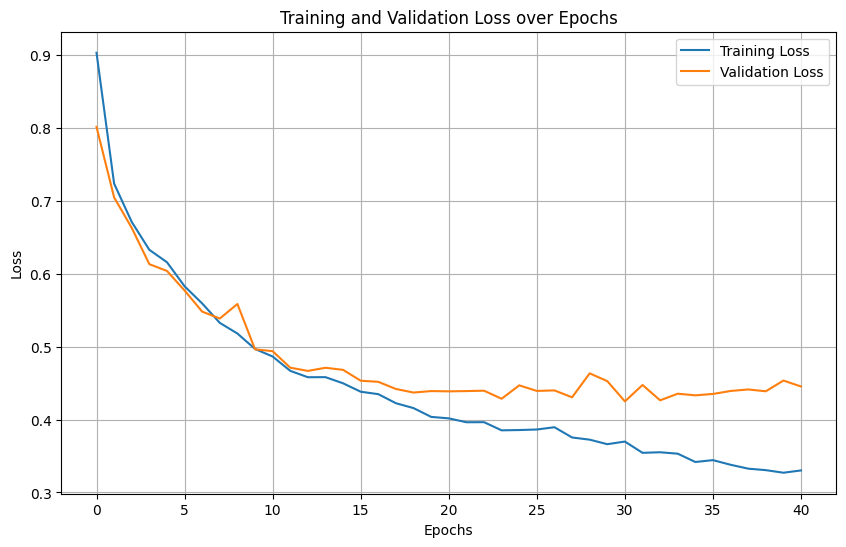

In [25]:
#Extract last epoch

# Get the history dictionary
history = model_history.history

# Get the total number of completed epochs
last_epoch = len(history['loss'])

#Plot losses

# Extract loss values
train_loss = model_history.history['loss']
val_loss = model_history.history['val_loss']
epochs_range = range(last_epoch)

# Plot
plt.figure(figsize=(10, 6))
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss over Epochs')
plt.legend()
plt.grid(True)
plt.show()

In [38]:
def show_predictions(dataset=None, num=1):
    count = 0
    for image, mask in dataset.take(num):  # Loop over the batches
        for i in range(min(num - count, image.shape[0])):  # Ensure not exceeding the number of images requested
            pred_mask = unet_model.predict(image[i:i+1])  # Predict for a single image at a time
            display_images(image[i], mask[i], create_mask(pred_mask))
            count += 1
            if count >= num:
                break
        if count >= num:
            break

def display_images(image, mask, pred_mask):
    plt.figure(figsize=(15, 5))

    title = ['Input Image', 'True Mask', 'Predicted Mask']
    images = [image, mask, pred_mask]

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        if images[i].shape[-1] == 1:
            plt.imshow(tf.squeeze(images[i]), cmap='gray')
        else:
            plt.imshow(images[i])
        plt.axis('off')

    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


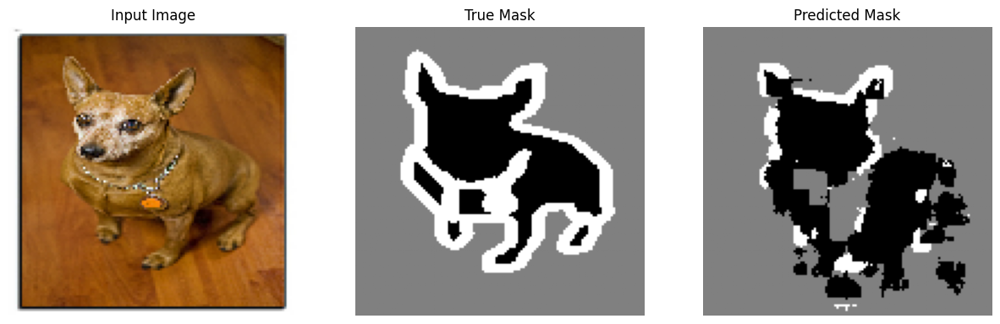

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


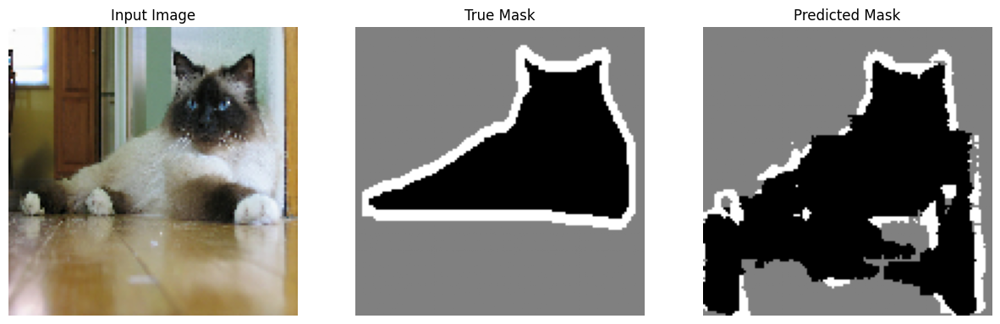

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


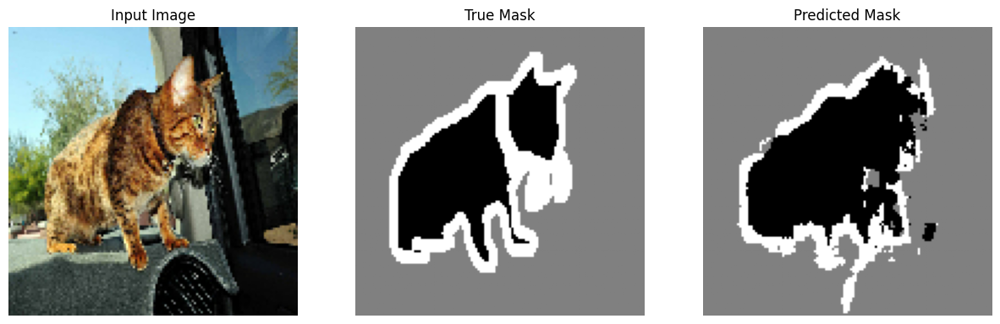

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


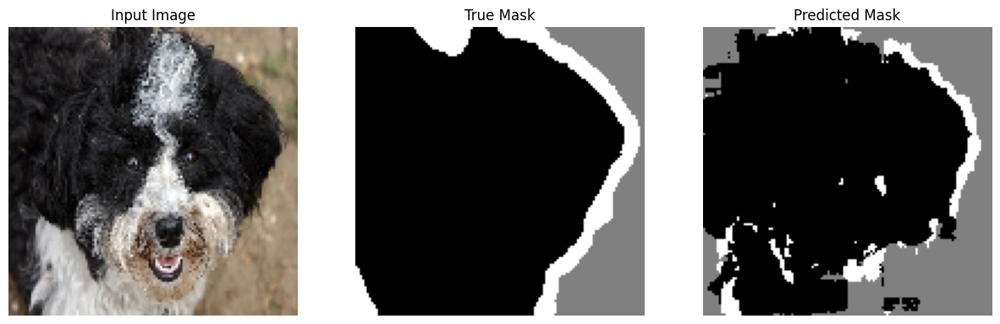

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


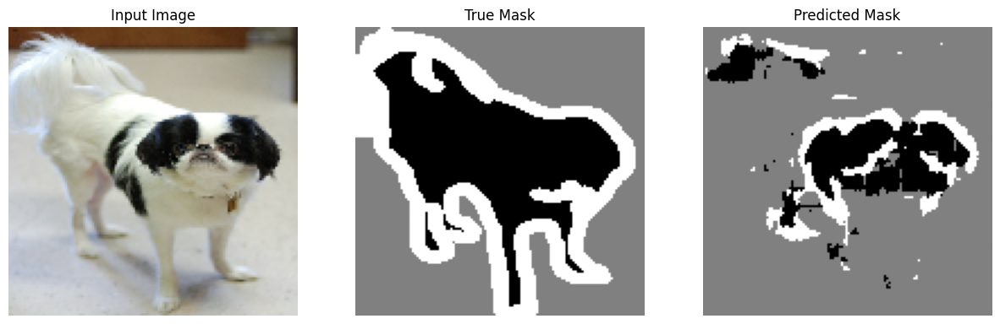

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


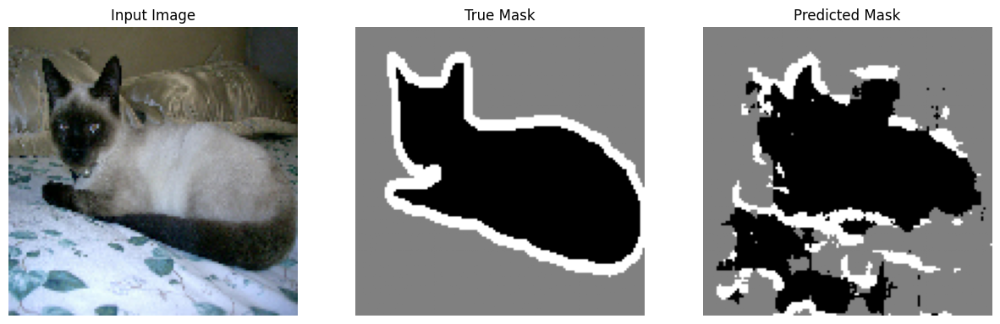

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


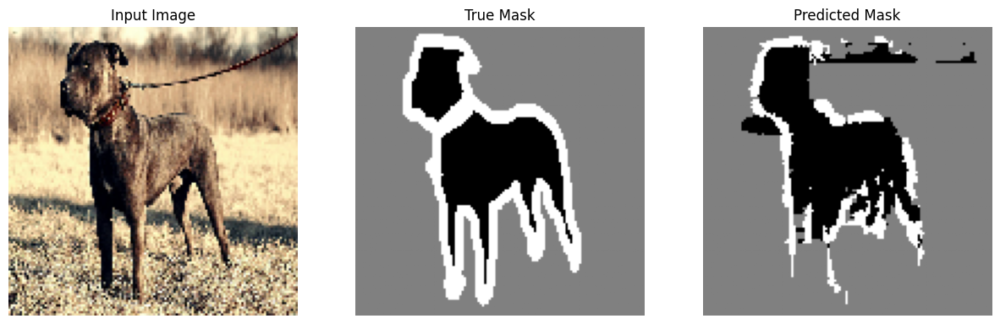

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


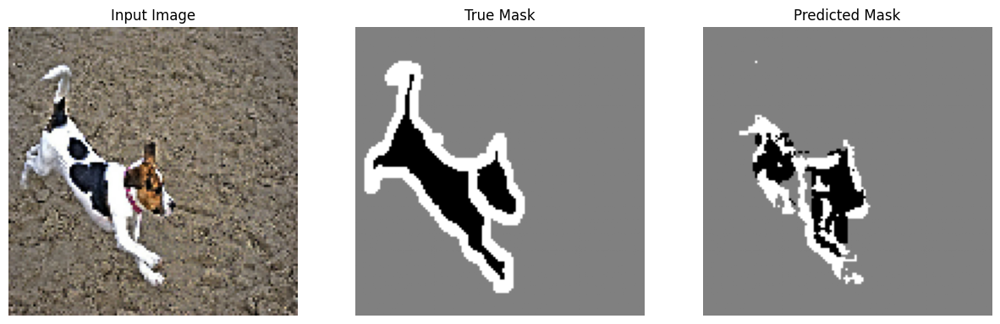

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


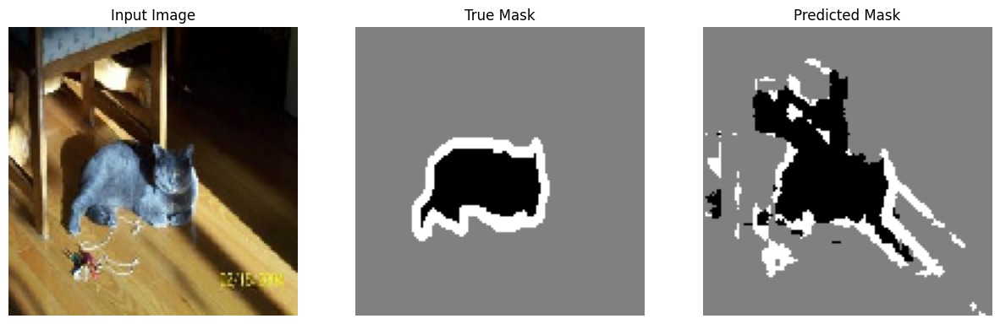

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


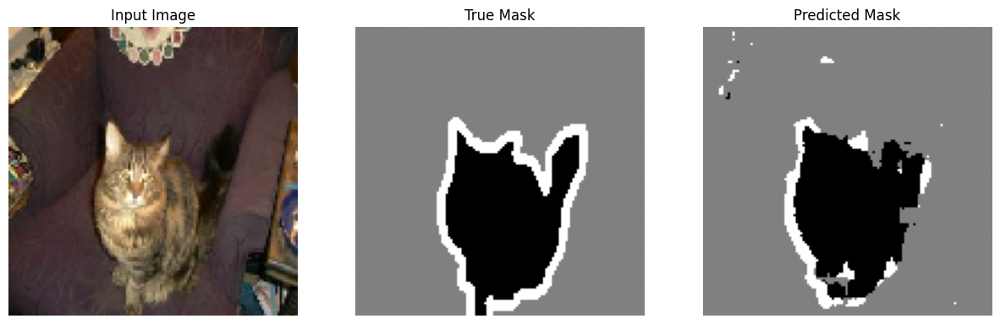

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


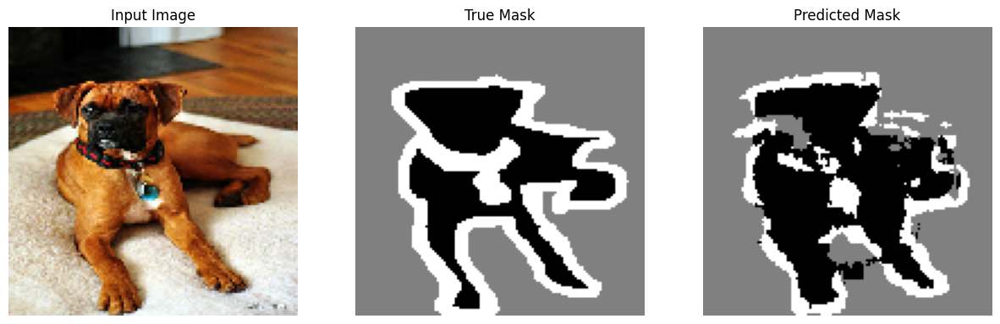

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


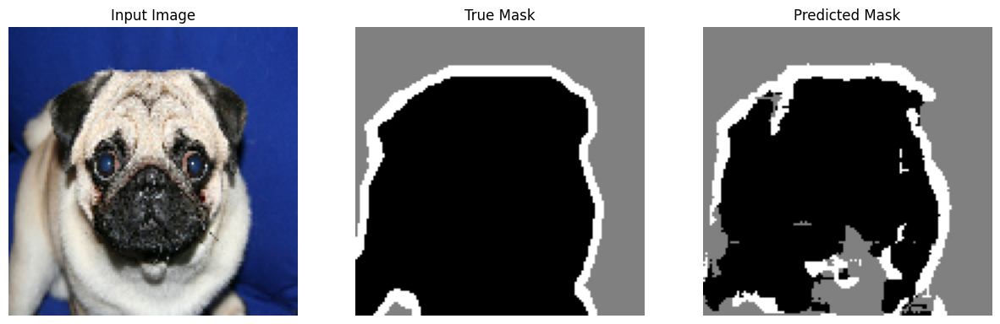

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


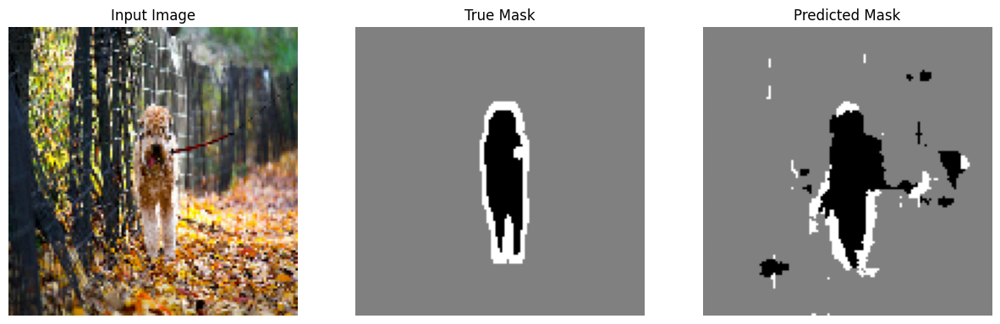

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


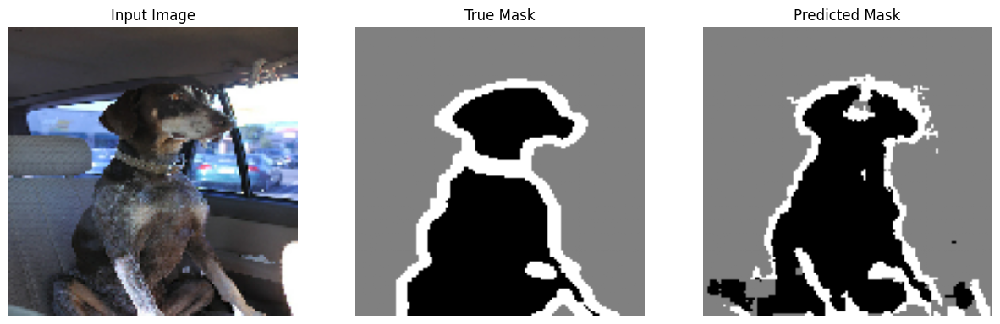

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


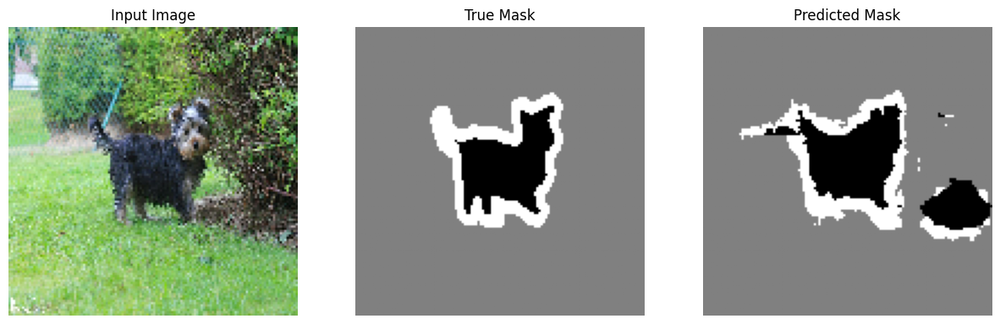

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


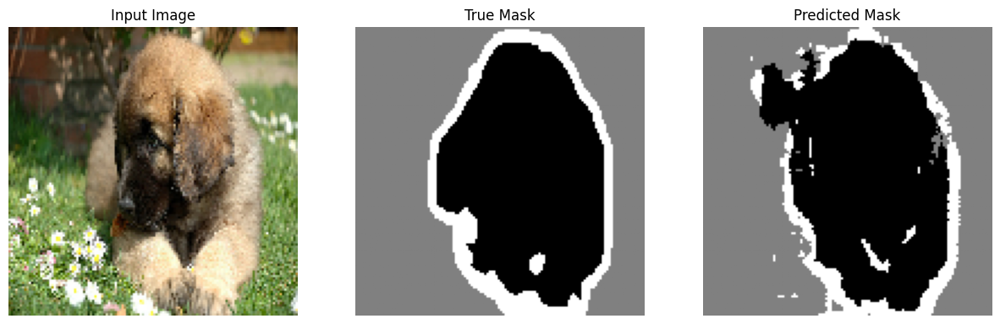

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


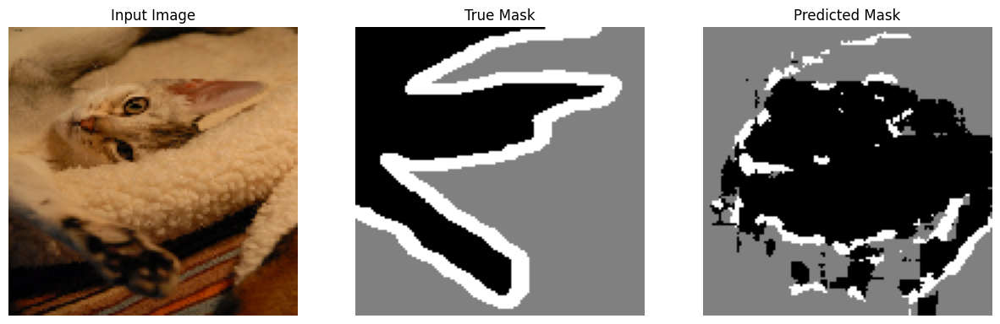

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


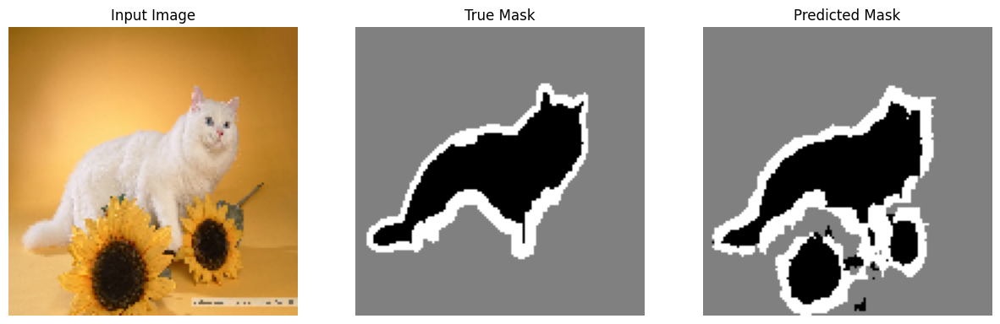

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


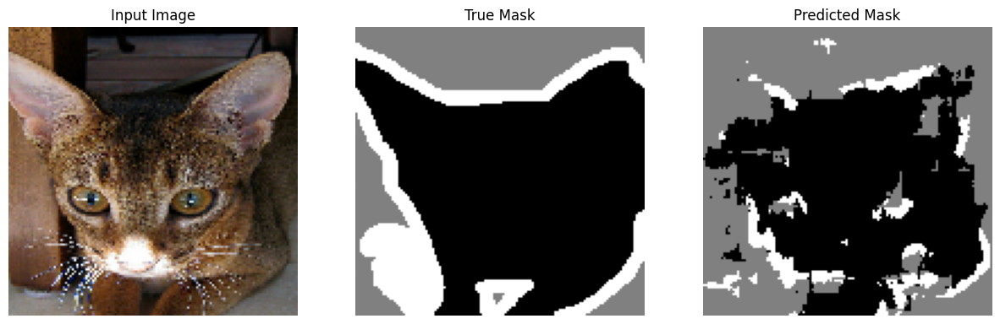

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


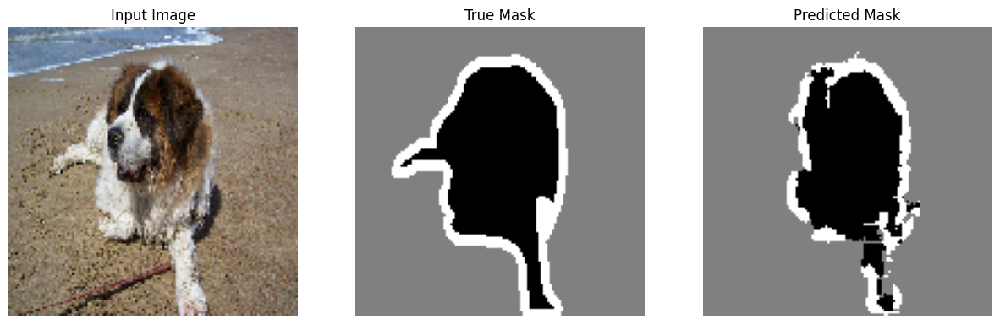

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


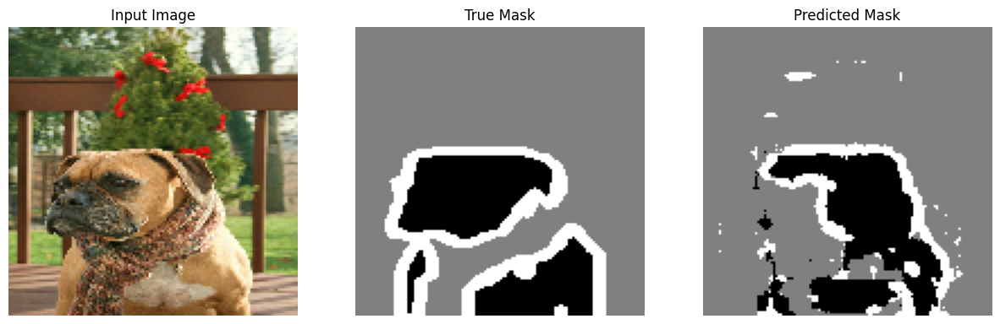

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


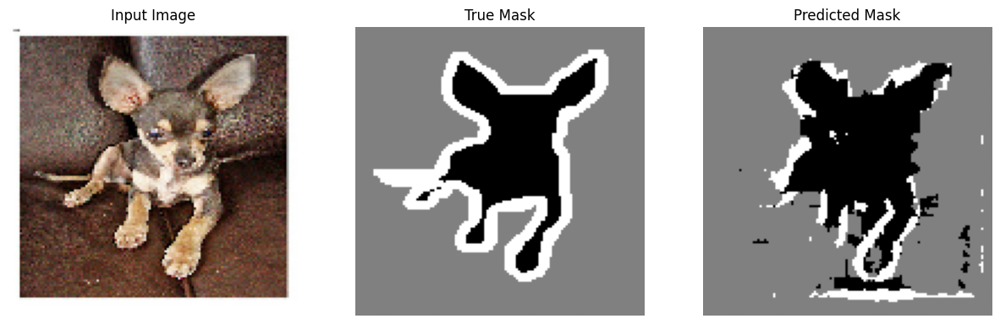

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


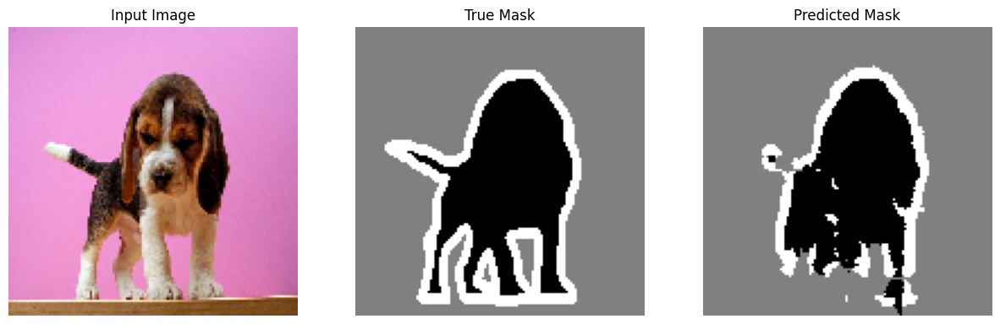

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


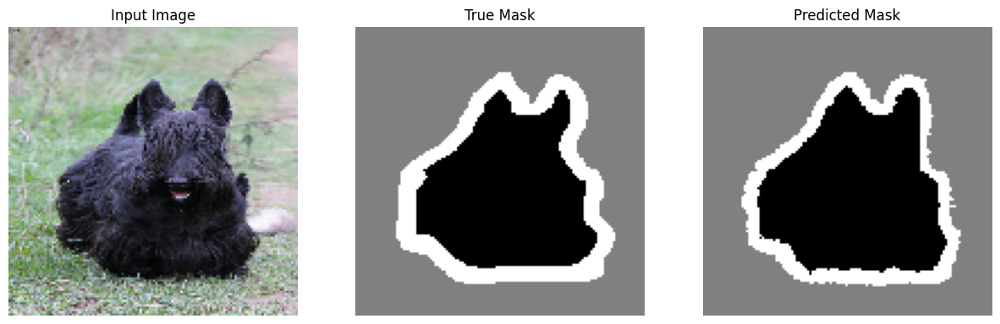

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


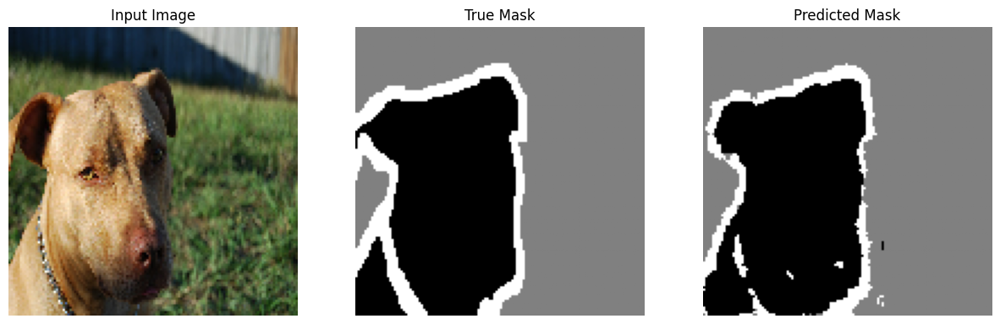

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


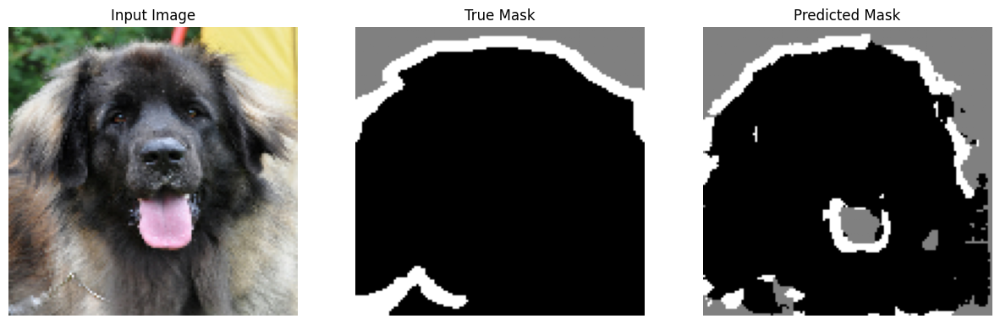

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


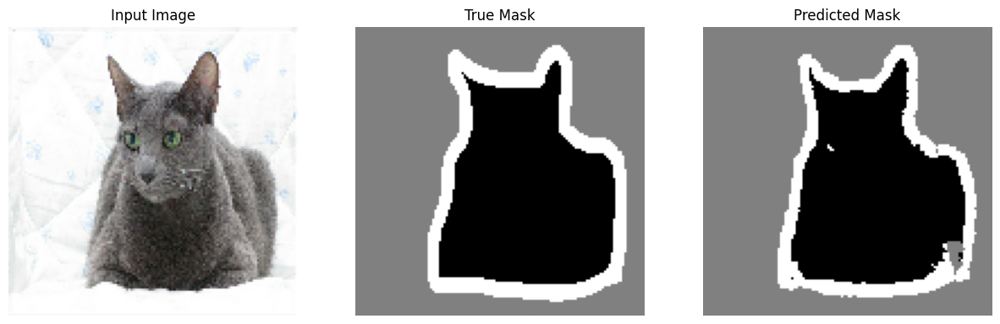

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


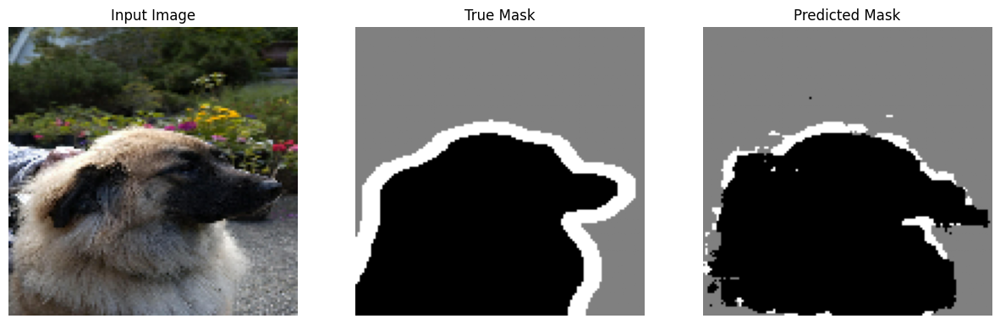

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


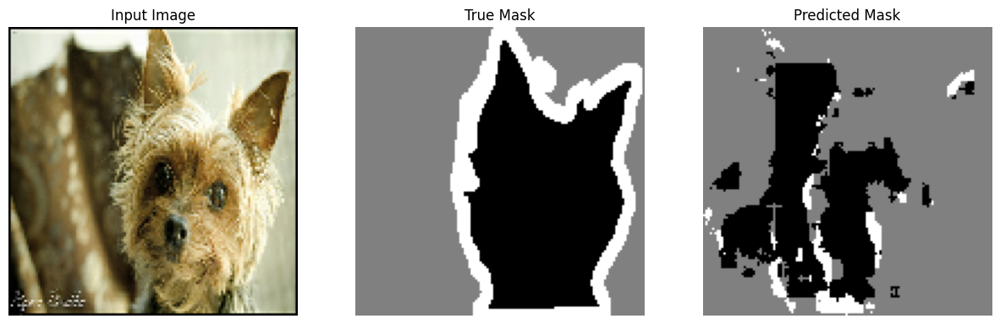

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


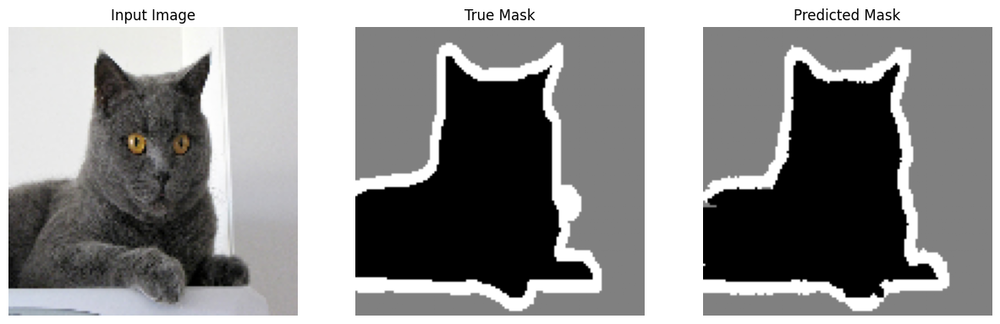

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


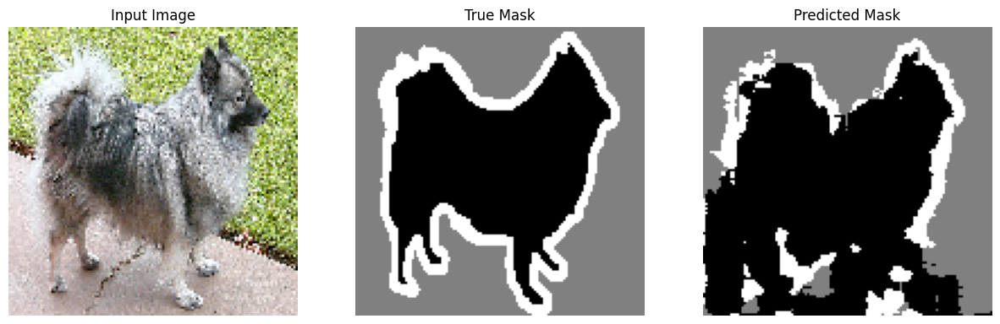

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


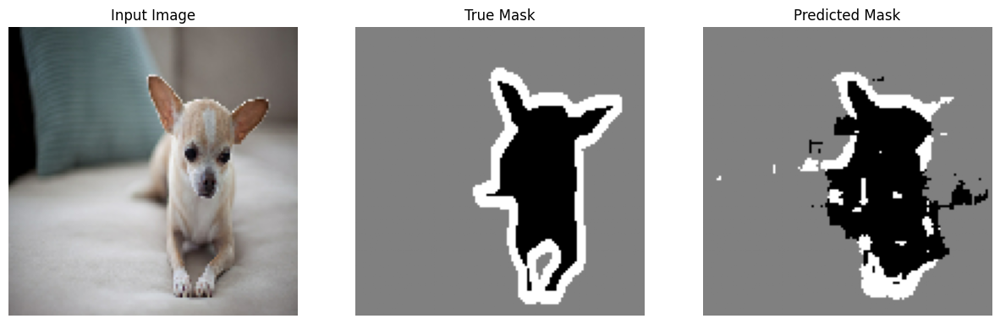

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


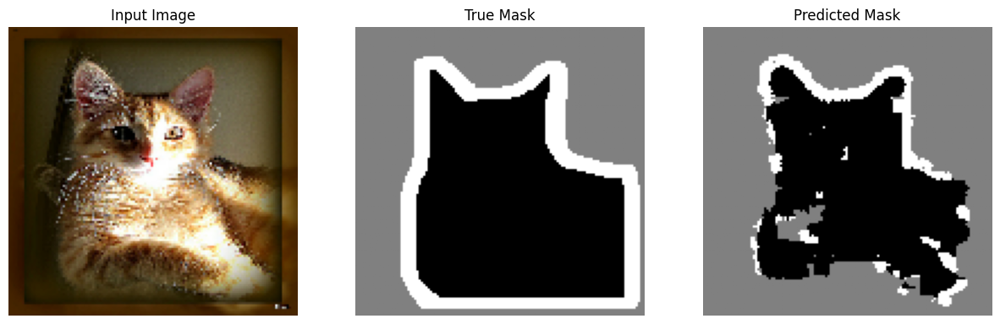

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


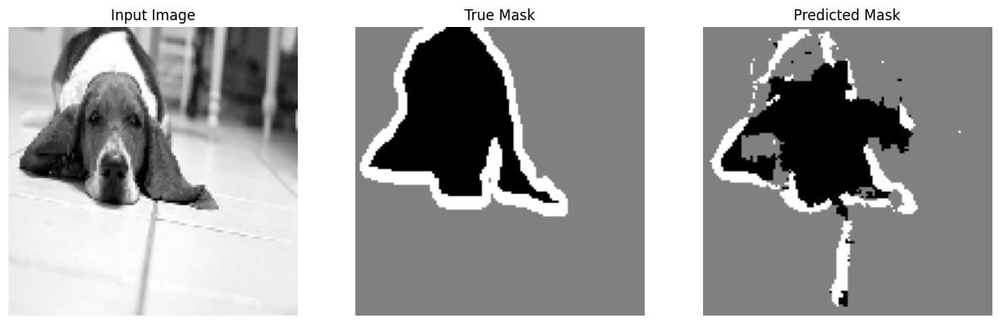

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


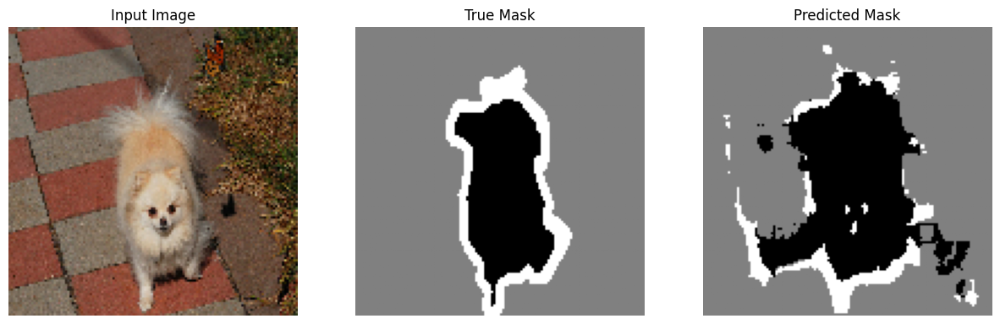

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


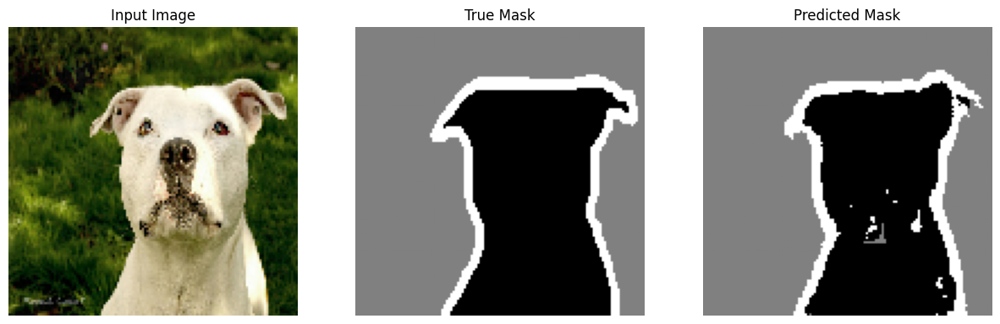

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


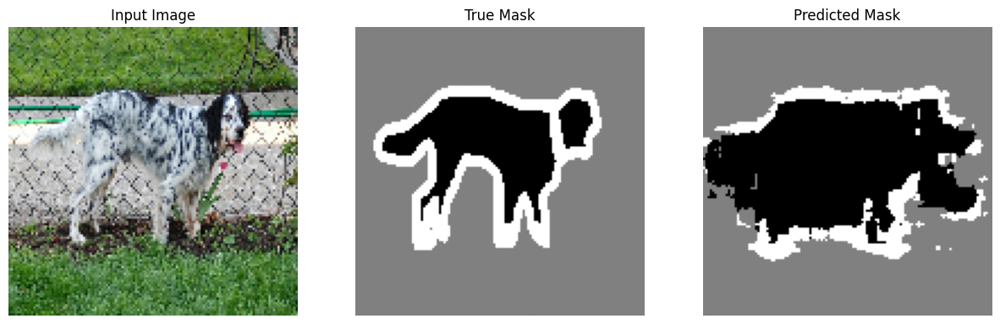

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


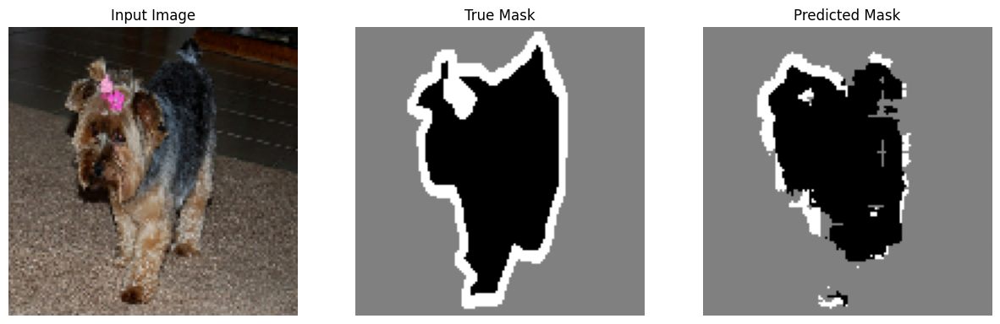

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


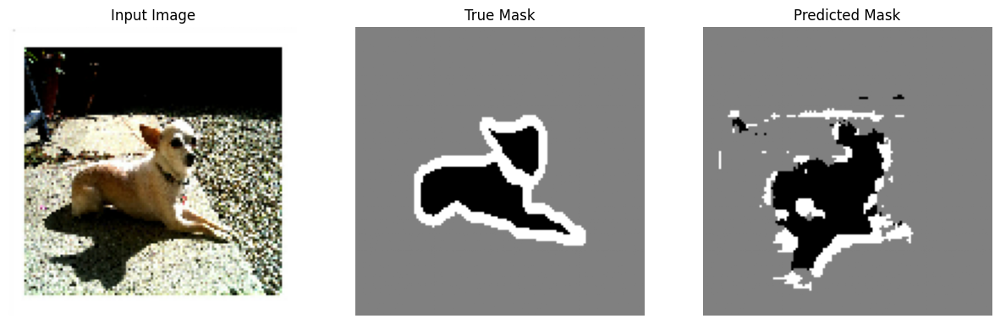

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


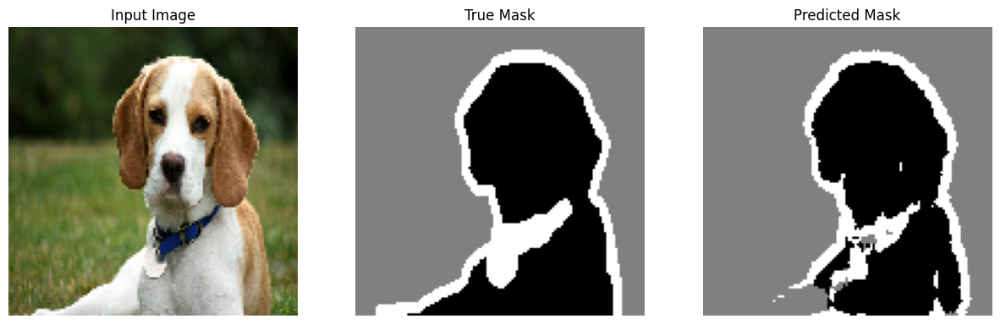

In [39]:
# Now show a limited number of images
show_predictions(dataset=test_batches, num=40)  # Show 10 batches, you can adjust the number

In [35]:
# Inspect the shape of the first batch in the dataset
for image, mask in test_batches.take(1):  # Take the first batch
    print(f"Image shape: {image.shape}")
    print(f"Mask shape: {mask.shape}")


Image shape: (64, 128, 128, 3)
Mask shape: (64, 128, 128, 1)
